In [13]:
# Plotly to explore one mooring prior to finalizing

In [14]:
import plotly.express as px
import plotly.graph_objects as go

In [15]:
import pandas as pd
import xarray as xr
import datetime
import glob

In [29]:
pandas = False
xarray = True

if pandas:
    files = glob.glob('../../moorings/2025/25bs2a/*.csv')

    tdf = pd.DataFrame()
    for file in files:
        df = pd.read_csv(file)
        df['timeseries_id'] = file.split('/')[-1].split('.csv')[0]
    
        tdf = pd.concat([tdf,df],axis=0)
if xarray:
    # files = glob.glob('../../moorings/2024/24bs8a/*.nc')
    files = glob.glob('/Users/bell/ecoraid/2025/Moorings/25bs2a/final_data_cf/*.nc')
    tdf = pd.DataFrame()
    for file in files:
        xdf = xr.load_dataset(file)
        df = xdf.to_dataframe()
        df['timeseries_id'] = file.split('/')[-1].split('.nc')[0]
    
        tdf = pd.concat([tdf,df],axis=0)

In [30]:
tdf

,,,,temperature,pressure,timeseries_id,chlor_fluorescence,conductivity,salinity,oxy_conc,oxy_temperature,oxy_percentsat,oxy_conc_umkg,oxy_conc_umkg_ctdcor
time,depth,latitude,longitude,,,,,,,,,,,
2025-04-30 04:10:00,17.0,56.866573,-164.061363,2.8774,16.164,25bs2a_s39_0017m,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2025-04-30 04:20:00,17.0,56.866573,-164.061363,2.8758,16.156,25bs2a_s39_0017m,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2025-04-30 04:30:00,17.0,56.866573,-164.061363,2.8853,16.173,25bs2a_s39_0017m,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2025-04-30 04:40:00,17.0,56.866573,-164.061363,2.8801,16.500,25bs2a_s39_0017m,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2025-04-30 04:50:00,17.0,56.866573,-164.061363,2.8910,16.573,25bs2a_s39_0017m,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-08-30 22:00:00,33.0,56.866573,-164.061363,4.3427,NaN,25bs2a_s39_0033m,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2025-08-30 22:10:00,33.0,56.866573,-164.061363,4.3344,NaN,25bs2a_s39_0033m,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2025-08-30 22:20:00,33.0,56.866573,-164.061363,4.3490,NaN,25bs2a_s39_0033m,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [71]:
tdf = tdf.reset_index().sort_values(['depth','time'])
tdf

,level_0,index,time,depth,latitude,longitude,temperature,pressure,timeseries_id,chlor_fluorescence,conductivity,salinity,oxy_conc,oxy_temperature,oxy_percentsat,oxy_conc_umkg,oxy_conc_umkg_ctdcor
5881,276977,276977,2025-04-30 00:45:00,1.0,56.876150,-164.054343,3.4121,NaN,25bspr2a_s16_0001m,NaN,2.952154,31.9830,350.082399,3.645151,104.501946,341.396738,341.396738
8833,276978,276978,2025-04-30 01:00:00,1.0,56.876150,-164.054343,3.5233,NaN,25bspr2a_s16_0001m,NaN,2.961925,31.9901,352.842383,3.657969,105.619513,344.089710,344.089710
8832,276979,276979,2025-04-30 01:15:00,1.0,56.876150,-164.054343,3.3717,NaN,25bspr2a_s16_0001m,NaN,2.952849,32.0313,350.849113,3.798352,104.660933,342.130390,342.130390
8831,276980,276980,2025-04-30 01:30:00,1.0,56.876150,-164.054343,3.8748,NaN,25bspr2a_s16_0001m,NaN,2.992919,32.0127,350.612703,4.153582,105.876044,341.920246,341.920246
8830,276981,276981,2025-04-30 01:45:00,1.0,56.876150,-164.054343,3.8082,NaN,25bspr2a_s16_0001m,NaN,2.996549,32.1211,352.551432,4.335470,106.366358,343.779885,343.779885
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
326076,276972,276972,2025-08-30 18:00:00,63.0,56.866573,-164.061363,4.3250,NaN,25bs2a_s37_0063m,NaN,3.023280,31.8976,NaN,NaN,NaN,NaN,NaN
326075,276973,276973,2025-08-30 19:00:00,63.0,56.866573,-164.061363,4.3235,NaN,25bs2a_s37_0063m,NaN,3.023300,31.8993,NaN,NaN,NaN,NaN,NaN
326074,276974,276974,2025-08-30 20:00:00,63.0,56.866573,-164.061363,4.3223,NaN,25bs2a_s37_0063m,NaN,3.023150,31.8987,NaN,NaN,NaN,NaN,NaN
326073,276975,276975,2025-08-30 21:00:00,63.0,56.866573,-164.061363,4.3224,NaN,25bs2a_s37_0063m,NaN,3.023210,31.8993,NaN,NaN,NaN,NaN,NaN


In [79]:
len(tdf.timeseries_id.unique())

14

In [80]:
n_colors=len(tdf.timeseries_id.unique())
colors = px.colors.sample_colorscale("viridis", n_colors)

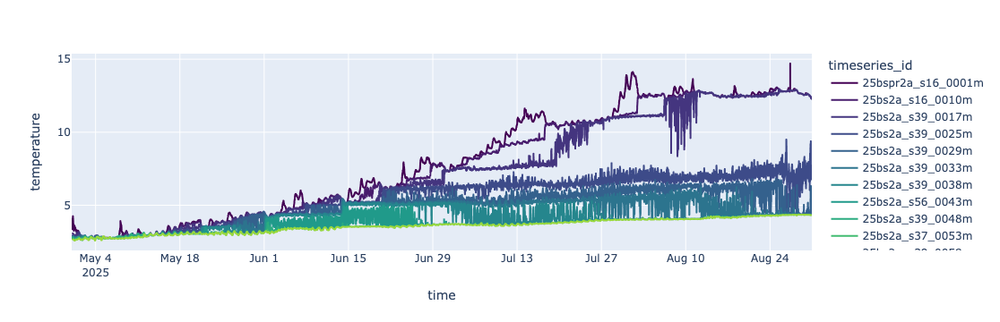

In [82]:
px.line(tdf.dropna(subset='temperature',how='all'),
        x='time',
        y='temperature',
        color='timeseries_id', 
        color_discrete_sequence=colors)

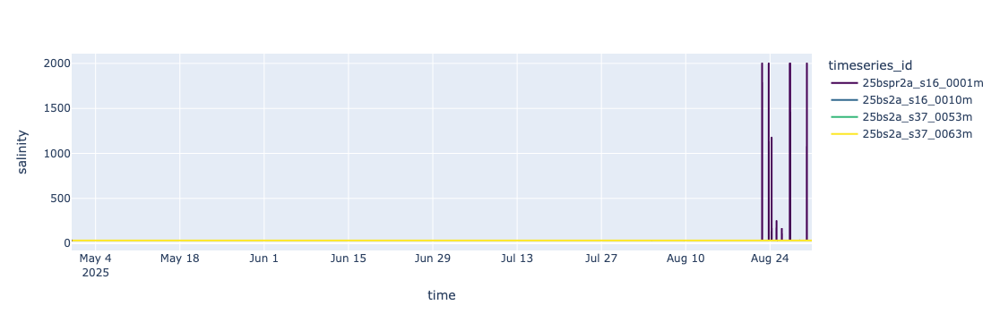

In [85]:
colors = px.colors.sample_colorscale("viridis", 4)

px.line(tdf.dropna(subset='salinity',how='all'),
        x='time',
        y='salinity',
        color='timeseries_id', 
        color_discrete_sequence=colors)

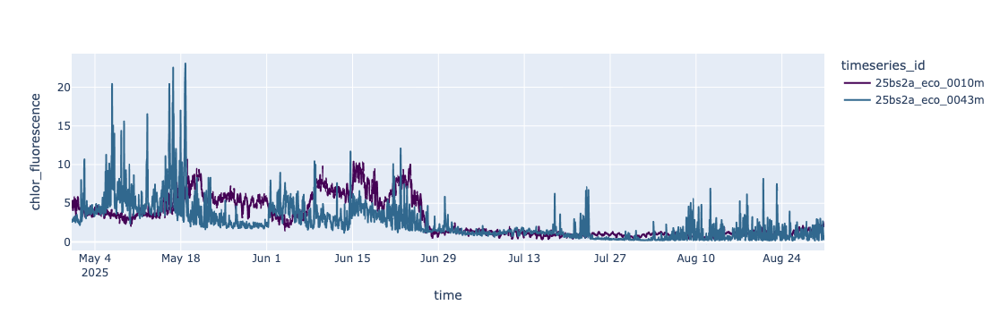

In [86]:
colors = px.colors.sample_colorscale("viridis", 4)

px.line(tdf.dropna(subset='chlor_fluorescence',how='all'),
        x='time',
        y='chlor_fluorescence',
        color='timeseries_id',
        color_discrete_sequence=colors)

In [22]:
# file/var output

tdf[['time','depth','latitude','longitude','temperature','timeseries_id']].dropna(subset='temperature',how='all').to_csv('24bs8a.temperature.csv')
tdf[['time','depth','latitude','longitude','salinity','timeseries_id']].dropna(subset='salinity',how='all').to_csv('24bs8a.salinity.csv')

vname = 'salinity'
with pd.ExcelWriter(f'24bs8a_{vname}.xlsx') as writer:  

    for depthkey in tdf.groupby('depth').groups.keys():
        if not (tdf.groupby('depth').get_group(depthkey).dropna(how='all'))[vname].empty:
            try:
                print(f'saving {depthkey}')
                (tdf.groupby('depth').get_group(depthkey).dropna(how='all',axis=1))[['time',vname,'timeseries_id']].to_excel(writer, sheet_name=str(depthkey))
            except:
                pass

tdf.groupby('depth').get_group(depthkey).dropna(how='all',axis=1)

saving 12.0
saving 17.0
saving 25.0
saving 29.0
saving 33.0
saving 38.0
saving 43.0
saving 45.0
saving 48.0
saving 58.0
saving 63.0


,time,depth,latitude,longitude,temperature,timeseries_id,conductivity,salinity
268139,2025-04-30 05:00:00,63.0,56.866573,-164.061363,2.6648,25bs2a_s37_0063m,2.89321,31.9785
268140,2025-04-30 06:00:00,63.0,56.866573,-164.061363,2.6652,25bs2a_s37_0063m,2.89347,31.9813
268141,2025-04-30 07:00:00,63.0,56.866573,-164.061363,2.6598,25bs2a_s37_0063m,2.89339,31.9857
268142,2025-04-30 08:00:00,63.0,56.866573,-164.061363,2.6534,25bs2a_s37_0063m,2.89314,31.9891
268143,2025-04-30 09:00:00,63.0,56.866573,-164.061363,2.6449,25bs2a_s37_0063m,2.89266,31.9917
...,...,...,...,...,...,...,...,...
271080,2025-08-30 18:00:00,63.0,56.866573,-164.061363,4.3250,25bs2a_s37_0063m,3.02328,31.8976
271081,2025-08-30 19:00:00,63.0,56.866573,-164.061363,4.3235,25bs2a_s37_0063m,3.02330,31.8993
271082,2025-08-30 20:00:00,63.0,56.866573,-164.061363,4.3223,25bs2a_s37_0063m,3.02315,31.8987
271083,2025-08-30 21:00:00,63.0,56.866573,-164.061363,4.3224,25bs2a_s37_0063m,3.02321,31.8993
